# Deep Convolutional GANs

In this notebook we will build a GAN to generate full colored images.

The complexity of this task require us to use convolutional layers both in the generator and the discriminator. 

## Preliminaries

Let's import the libraries we will use.

In [1]:
%matplotlib inline
import pickle as pkl
import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf
from urllib.request import urlretrieve
import os
from tqdm import tqdm

## Data

This time we generate images from the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) dataset, which is considerably more complex than MNIST. 

These are color images of house numbers collected from Google Street View. 

To download the data, we'll need the aid of the following function:

In [2]:
output_directory = 'data/'

class DownloadProgress(tqdm):
    last_block = 0
    
    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num
        
def download_and_load_data():
    training_data_file_name = 'train_32x32.mat'
    test_data_file_name = 'test_32x32.mat'
    base_url = 'http://ufldl.stanford.edu/housenumbers'
    
    if not os.path.exists(output_directory):
        print(f'Output directory {output_directory} does not exist. Creating it.')
        os.mkdir(output_directory)
    
    train_data_output_file = os.path.join(output_directory, training_data_file_name)
    if not os.path.isfile(train_data_output_file):
        with DownloadProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as progress_bar:
            urlretrieve(f'{base_url}/{training_data_file_name}', 
                        train_data_output_file,
                        progress_bar.hook)

    test_data_output_file = os.path.join(output_directory, test_data_file_name)
    if not os.path.isfile(test_data_output_file):
        with DownloadProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as progress_bar:
            urlretrieve(f'{base_url}/{test_data_file_name}', 
                        test_data_output_file,
                        progress_bar.hook)
            
    train_data = loadmat(train_data_output_file)
    test_data = loadmat(test_data_output_file)
    
    return train_data, test_data

Nice. Let's proceed to download the data.

In [3]:
training, test = download_and_load_data()

## Peeking at the Data

Now that we've downloaded the data, let's get familiar with it.

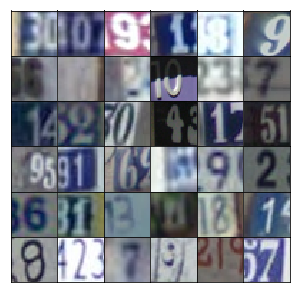

In [4]:
index = np.random.randint(0, training['X'].shape[3], size=36)

fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5, 5))
for i, ax in zip(index, axes.flatten()):
    ax.imshow(training['X'][:, :, :, i], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

plt.subplots_adjust(wspace=0, hspace=0)

We can see these images are quite challenging because not all numbers are in the same resolution, nor porperly centered in the image, and also their lighting conditions vary. 

In order to ease the learning process of our network, we must preprocess these images.

## Preprocessing

Let's create a data generator that also preprocesses the images in each batch it produces.

In [5]:
def scale(x, range=(-1, 1)):
    # Scale to (0, 1)
    x = (x - x.min()) / (x.max() - x.min())
    
    # Scare to input range
    minimum, maximum = range
    x = x * (maximum - minimum) + minimum
    return x

class Dataset(object):
    def __init__(self,
                 train, 
                 test, 
                 validation_proportion=0.5,
                 shuffle=False,
                 scale_function=None):
        split_index = int(len(test['y']) * (1 - validation_proportion))
        self.test_x = test['X'][:, :, :, :split_index]
        self.valid_x = test['X'][:, :, :, split_index:]
        
        self.test_y = test['y'][:split_index]
        self.valid_y = test['y'][split_index:]
        
        self.train_x = train['X']
        self.train_y = test['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_function is None:
            self.scaler = scale
        else:
            self.scaler = scale_function
            
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            index = np.arange(len(self.train_x))
            np.random.shuffle(index)
            
            self.train_x = self.train_x[index]
            self.train_y = self.train_y[index]
            
        for i in range(0, len(self.train_y), batch_size):
            x = self.train_x[i : i + batch_size]
            y = self.train_y[i : i + batch_size]
            
            x = self.scaler(x)
            yield x, y

## Architecture

We can now build the network. First, let's create some placeholders:

In [6]:
def model_inputs(input_dimensions, generated_dimensions):
    inputs_real = tf.placeholder(tf.float32, (None, *input_dimensions), name='input_real')
    inputs_generated = tf.placeholder(tf.float32, (None, generated_dimensions), name='input_generated')
    
    return inputs_real, inputs_generated

### Generator

This generator follows the same logic than the generator of a regular GAN, only that this time we'll need to upsample the input at each step. For that matter, we'll use transposed convolutions which, in essence, are complementary to the traditional convolutional layers. This means that they take the input and produce a narrower, wider and higher output. Then we'll use batch normalization and leaky ReLUs to speed up the training process and also prevent the network from forgetting what it's learnt.

In [7]:
def generator(noise_input, output_dimensions, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        x1 = tf.layers.dense(noise_input, 4 * 4 * 512)
        
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=training)
        x1 = tf.maximum(alpha * x1, x1)  # This is the leaky ReLU.
        # 4x4x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=training)
        x2 = tf.maximum(alpha * x2, x2)
        # 8x8x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=training)
        x3 = tf.maximum(alpha * x3, x3)
        # 16x16x128
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, output_dimensions, 5, strides=2, padding='same')
        # 32x32xoutput_dimensions now
        
        return tf.tanh(logits)  # Activation

### Discriminator

The discriminator is just a normal convolutional neural network... Nothing fancy here.

In [8]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(x, 64, 5, strides=2, padding='same')
        x1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d(x1, 128, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = tf.maximum(alpha * x2, x2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(x2, 256, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=True)
        x3 = tf.maximum(alpha * x3, x3)
        # 4x4x256
        
        # Flatten
        x3 = tf.reshape(x3, (-1, 4 * 4 * 256))
        logits = tf.layers.dense(x3, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

### Loss

In [9]:
def model_loss(real_input, generated_input, output_dimensions, alpha=0.2):
    generator_model = generator(generated_input, output_dimensions, alpha=alpha)
    real_discriminator_model, real_discriminator_logits = discriminator(real_input, alpha=alpha)
    fake_discriminator_model, fake_discriminator_logits = discriminator(generator_model, reuse=True, alpha=alpha)
    
    real_discriminator_labels = tf.ones_like(real_discriminator_model)
    real_discriminator_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=real_discriminator_logits, labels=real_discriminator_labels))

    fake_discriminator_labels = tf.zeros_like(fake_discriminator_model)
    fake_discriminator_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=fake_discriminator_logits, labels=fake_discriminator_labels))
    
    discriminator_loss = real_discriminator_loss + fake_discriminator_loss
    
    generator_labels = tf.ones_like(fake_discriminator_model)
    generator_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=fake_discriminator_logits, labels=generator_labels))
    
    return discriminator_loss, generator_loss

### Optimizers

In [10]:
def model_optimizers(discriminator_loss, generator_loss, learning_rate, beta1):
    trainable_variables = tf.trainable_variables()
    discriminator_variables = [v for v in trainable_variables
                               if v.name.startswith('discriminator')]
    generator_variables = [v for v in trainable_variables
                            if v.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        discriminator_optimizer = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(discriminator_loss, var_list=discriminator_variables)
        generator_optimizer = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(generator_loss, var_list=generator_variables)
        
    return discriminator_optimizer, generator_optimizer

### Actual Model

Here we can use the functions defined in the previous cells to build the actual model

In [11]:
class DCGAN(object):
    def __init__(self, input_size, generated_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.real_input, self.generated_input = model_inputs(input_size, generated_size)
        self.discriminator_loss, self.generator_loss = model_loss(self.real_input, self.generated_input, input_size[2], alpha=alpha)
        self.discriminator_optimizer, self.generator_optimizer = model_optimizers(self.discriminator_loss, self.generator_loss, learning_rate, beta1)

The following function will allow us to display images easily:

In [12]:
def view_samples(epoch, samples, number_of_rows, number_of_cols, figsize=(5, 5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=number_of_rows, ncols=number_of_cols, sharey=True, sharex=True)
    
    for ax, image in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        image = ((image - image.min()) * 255 / (image.max() - image.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        image = ax.imshow(image, aspect='equal')
        
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

Finally, here's a helper function to train the model. 

In [13]:
def train(network, dataset, parameters, print_every=10, show_every=100, figsize=(5, 5)):
    saver = tf.train.Saver()
    generated_sample = np.random.uniform(-1, 1, size=(72, parameters['generated_size']))
    
    samples = []
    losses = []
    steps = 0
    
    with tf.Session() as s:
        s.run(tf.global_variables_initializer())
        
        for epoch in range(parameters['epochs']):
            for x, y in dataset.batches(parameters['batch_size']):
                steps += 1
                
                generated_batch = np.random.uniform(-1, 1, size=(parameters['batch_size'], parameters['generated_size']))
                
                s.run(network.discriminator_optimizer, feed_dict={
                        network.real_input: x,
                        network.generated_input: generated_batch
                    })
                s.run(network.generator_optimizer, feed_dict={
                        network.generated_input: generated_batch,
                        network.real_input: x
                    })
                
                if steps % show_every == 0:
                    generated_samples = s.run(generator(network.generated_input, 3, reuse=True, training=False),
                                              feed_dict={network.generated_input: generated_sample})
                    samples.append(generated_samples)
                    
                    view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()
        
        saver.save(s, './checkpoints/generator.ckpt')
    
    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
        
    return losses, samples

### Hyperparameters

Hyperparameters are maybe the hardes part to get right about GANs, because don't want any of the subnetworks overpowering the other.

In [ ]:
input_size = (32, 32, 3)
learning_rate = 0.0002
alpha = 0.2
beta1 = 0.5

parameters = {
    'generated_size': 100,
    'epochs': 25,
    'batch_size': 16
}


network = DCGAN(input_size, parameters['generated_size'], learning_rate, alpha=alpha, beta1=beta1)

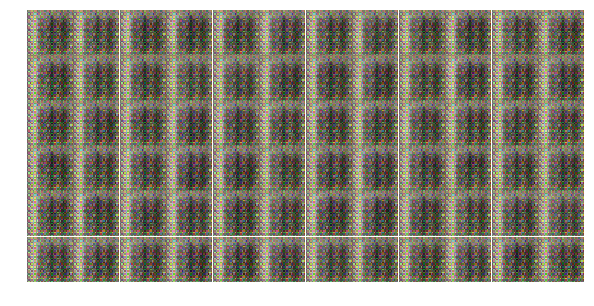

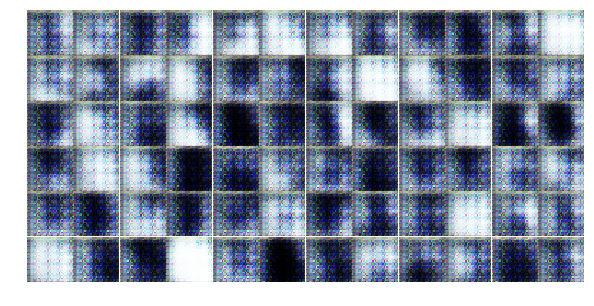

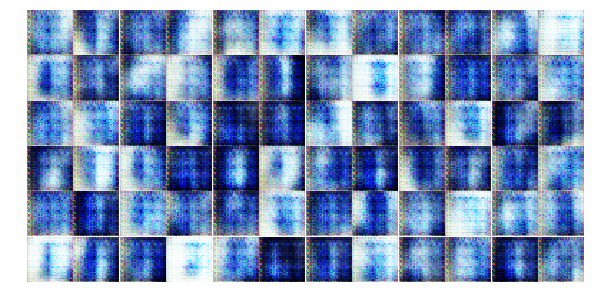

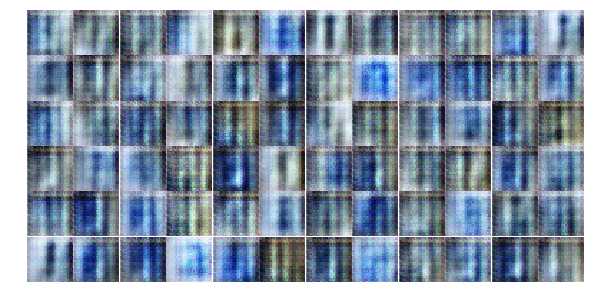

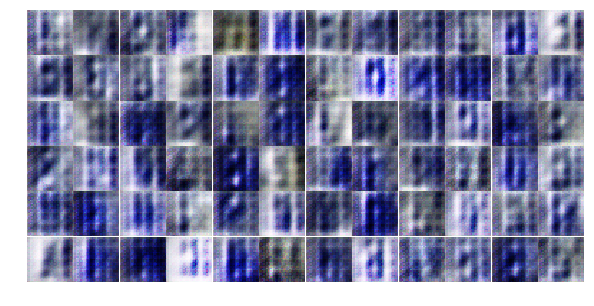

...

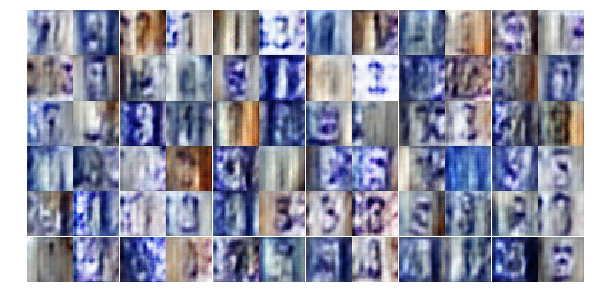

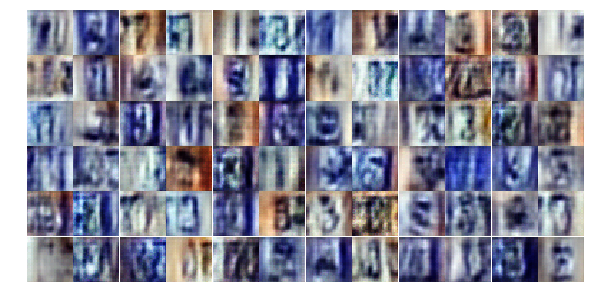

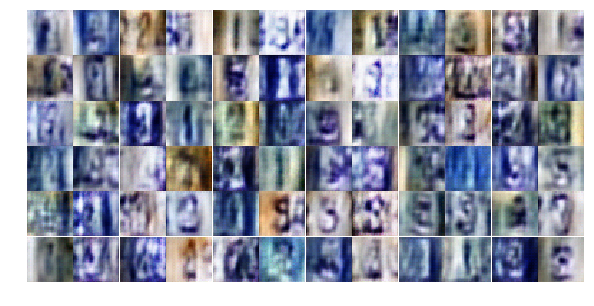

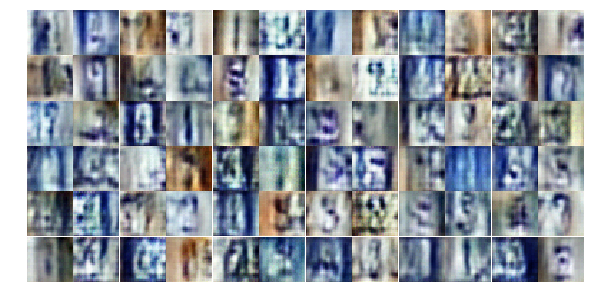

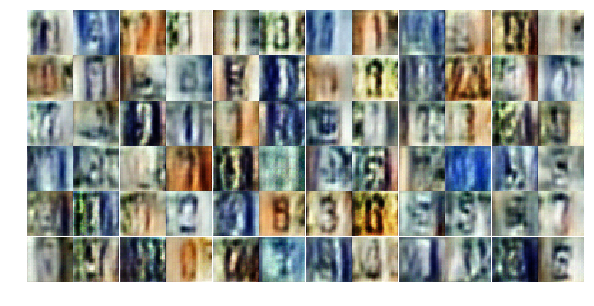

In [ ]:
dataset = Dataset(training, test)

losses, samples = train(network, dataset, parameters, figsize=(10, 5))

In [ ]:
fig, ax = plt.subplots()
losses = np.array(losses)

plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title('Training losses')
plt.legend()

In [ ]:
view_samples(-1, samples, 6, 12, figsize(10, 5))